In [ ]:
"""
#! pip install optuna
#! pip install numpy
#! pip install pandas
! pip install matplotlib
! pip install seaborn
! pip install plotly
! pip install xgboost
! pip install scikit-learn
! pip install Jinja2
! pip install ipykernel
! pip install --upgrade nbformat
"""

In [1]:
# Math & Data Processing
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Data Visualizations
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
sns.set_theme(style='whitegrid', palette='viridis')

# Machine Learning Training & Testing
import optuna
import xgboost as xgb
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report

# For checking time to complete specific operation / process
import time

# Ignore Warnings
import warnings
warnings.filterwarnings('ignore')


C:\Users\ongwe\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.12_qbz5n2kfra8p0\LocalCache\local-packages\Python312\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
df1 = pd.read_csv("C:/Users/ongwe\OneDrive - Universiti Teknologi PETRONAS/NTUT Year 4 Semester 1/Big Data Analytics/Jessica/FinalTeamProject/Diabetes/diabetes_012_health_indicators_BRFSS2021.csv")
df2 = pd.read_csv("C:/Users/ongwe\OneDrive - Universiti Teknologi PETRONAS/NTUT Year 4 Semester 1/Big Data Analytics/Jessica/FinalTeamProject/Diabetes/diabetes_binary_5050split_health_indicators_BRFSS2021.csv")
df3 = pd.read_csv("C:/Users/ongwe\OneDrive - Universiti Teknologi PETRONAS/NTUT Year 4 Semester 1/Big Data Analytics/Jessica/FinalTeamProject/Diabetes/diabetes_binary_health_indicators_BRFSS2021.csv")
#df1 = pd.read_csv('C:/Users/ongwe/Desktop/diabetes_012_health_indicators_BRFSS2021.csv')

In [6]:
df1.head()

,Diabetes_012,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,0.0,0,1.0,1,15.0,1.0,0.0,0.0,0,1,...,1,0.0,5.0,10.0,20.0,0.0,0,11,4.0,5.0
1,2.0,1,0.0,1,28.0,0.0,0.0,1.0,0,1,...,1,0.0,2.0,0.0,0.0,0.0,0,11,4.0,3.0
2,2.0,1,1.0,1,33.0,0.0,0.0,0.0,1,1,...,1,0.0,2.0,10.0,0.0,0.0,0,9,4.0,7.0
3,2.0,0,1.0,1,29.0,0.0,1.0,1.0,1,1,...,1,0.0,5.0,0.0,30.0,1.0,1,12,3.0,4.0
4,0.0,0,0.0,1,24.0,1.0,0.0,0.0,0,0,...,1,0.0,3.0,0.0,0.0,1.0,1,13,5.0,6.0


In [ ]:
df2.head()

In [7]:
# normalize 3x class into binary and rename to 'Diabetes_binary'
df1['Diabetes_012'] = df1['Diabetes_012'].replace({1: 1, 2: 1, 0: 0})
df1.rename(columns={'Diabetes_012': 'Diabetes_binary'}, inplace=True)

In [3]:
df = pd.concat([df1, df2, df3], ignore_index=True)

In [4]:
df.head()

,Diabetes_012,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income,Diabetes_binary
0,0.0,0,1.0,1,15.0,1.0,0.0,0.0,0,1,...,0.0,5.0,10.0,20.0,0.0,0,11,4.0,5.0,NaN
1,2.0,1,0.0,1,28.0,0.0,0.0,1.0,0,1,...,0.0,2.0,0.0,0.0,0.0,0,11,4.0,3.0,NaN
2,2.0,1,1.0,1,33.0,0.0,0.0,0.0,1,1,...,0.0,2.0,10.0,0.0,0.0,0,9,4.0,7.0,NaN
3,2.0,0,1.0,1,29.0,0.0,1.0,1.0,1,1,...,0.0,5.0,0.0,30.0,1.0,1,12,3.0,4.0,NaN
4,0.0,0,0.0,1,24.0,1.0,0.0,0.0,0,0,...,0.0,3.0,0.0,0.0,1.0,1,13,5.0,6.0,NaN


In [10]:
def summary(df):
    summary_df = pd.DataFrame(df.dtypes, columns=['dtypes'])
    summary_df['missing#'] = df.isna().sum()
    summary_df['missing%'] = (df.isna().sum())/len(df)
    summary_df['unique'] = df.nunique().values
    summary_df['count'] = df.count().values
    return summary_df

summary(df).style.background_gradient(cmap='Purples')

,dtypes,missing#,missing%,unique,count
Diabetes_binary,float64,0,0.000000,2,539892
HighBP,int64,0,0.000000,2,539892
HighChol,float64,0,0.000000,2,539892
CholCheck,int64,0,0.000000,2,539892
BMI,float64,0,0.000000,84,539892
Smoker,float64,0,0.000000,2,539892
Stroke,float64,0,0.000000,2,539892
HeartDiseaseorAttack,float64,0,0.000000,2,539892
PhysActivity,int64,0,0.000000,2,539892
Fruits,int64,0,0.000000,2,539892


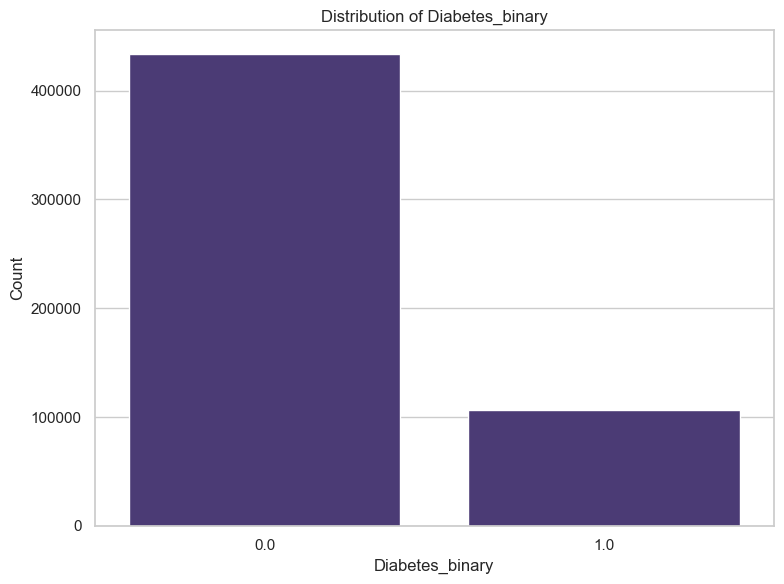

In [11]:
# Plot distribution of the target variable 'Diabetes_binary'
plt.figure(figsize=(8, 6), dpi=100)
sns.countplot(x='Diabetes_binary', data=df)
plt.title('Distribution of Diabetes_binary')
plt.xlabel('Diabetes_binary')
plt.ylabel('Count')
plt.tight_layout()
plt.show()

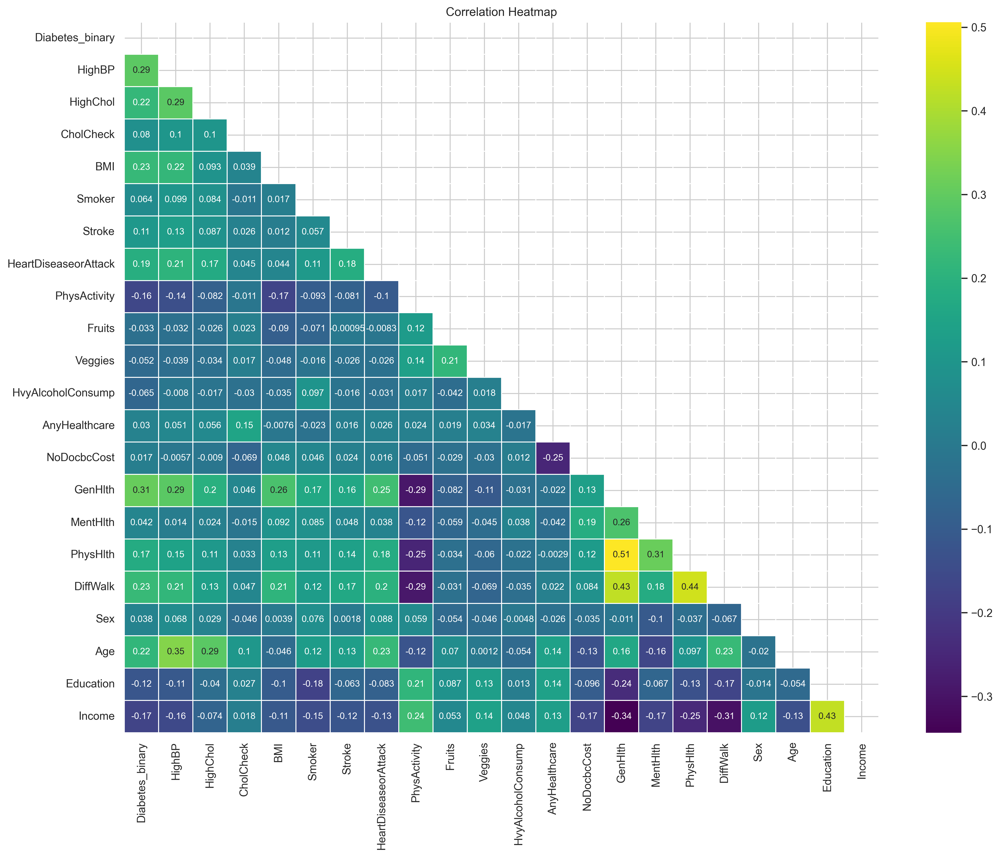

In [12]:
# Plot correlation heatmap
plt.figure(figsize=(15, 12), dpi=300)
corr_matrix = df.corr()
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
sns.heatmap(corr_matrix, annot=True, mask=mask, cmap='viridis', linewidth=.5, annot_kws={'size': 9})
plt.title('Correlation Heatmap')
plt.tight_layout()
plt.show()

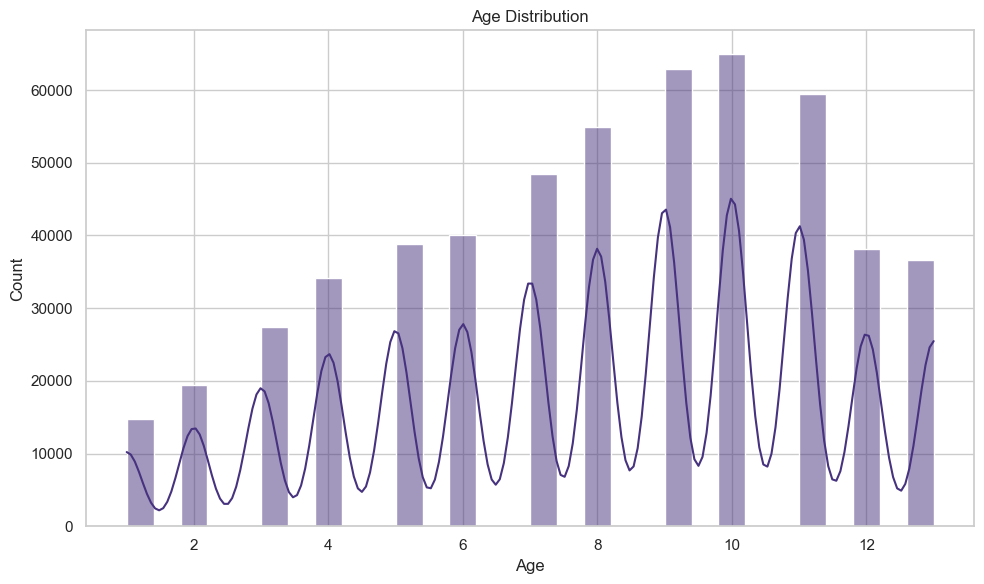

In [13]:
# Plot age distribution
plt.figure(figsize=(10, 6), dpi=100)
sns.histplot(df['Age'], bins=30, kde=True)
plt.title('Age Distribution')
plt.xlabel('Age')
plt.ylabel('Count')
plt.tight_layout()
plt.show()

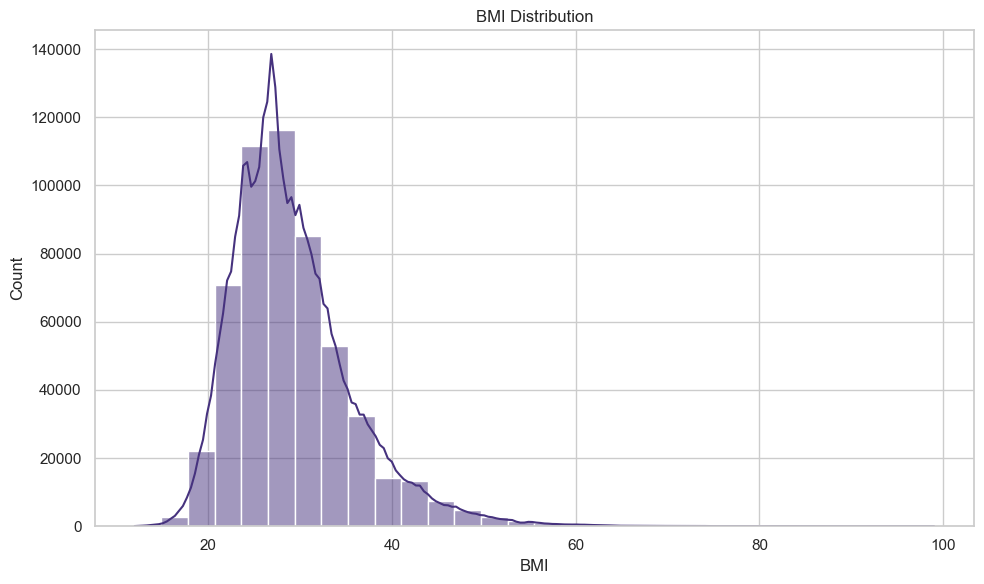

In [14]:
# Plot BMI Distribution
plt.figure(figsize=(10, 6), dpi=100)
sns.histplot(df['BMI'], bins=30, kde=True)
plt.title('BMI Distribution')
plt.xlabel('BMI')
plt.ylabel('Count')
plt.tight_layout()
plt.show()

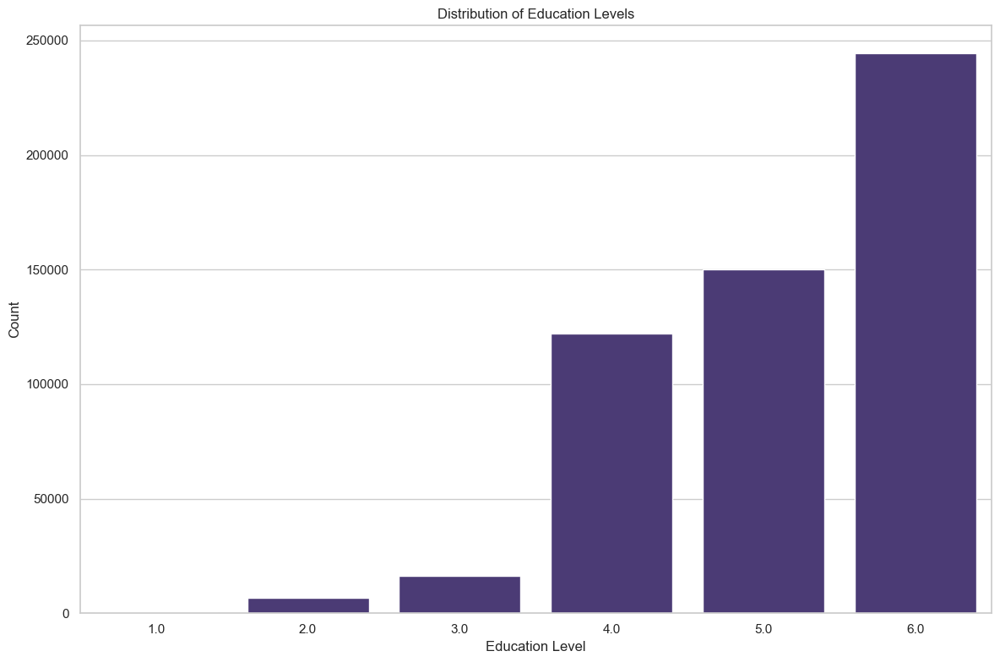

In [15]:
# Plot Distribution of Education Levels
plt.figure(figsize=(12, 8), dpi=100)
sns.countplot(x='Education', data=df)
plt.title('Distribution of Education Levels')
plt.xlabel('Education Level')
plt.ylabel('Count')
plt.tight_layout()
plt.show()

In [16]:
fig = px.box(df, x='Diabetes_binary', y='Income', color='Diabetes_binary',
                labels={'Diabetes_binary': 'Diabetes Binary', 'Income': 'Income Level'},
                title='Income Distribution by Diabetes Binary')
fig.show()

 ML Training & Testing using XGBoostClassifier

In [17]:
X = df.drop(columns=['Diabetes_binary'])
y = df['Diabetes_binary']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [18]:
def objective(trial):
    params = {
        'objective': 'binary:logistic',
        'eval_metric': 'logloss',
        'booster': trial.suggest_categorical('booster', ['gbtree', 'gblinear', 'dart']),
        'lambda': trial.suggest_loguniform('lambda', 1e-8, 1.0),
        'alpha': trial.suggest_loguniform('alpha', 1e-8, 1.0),
        'max_depth': trial.suggest_int('max_depth', 3, 20),
        'eta': trial.suggest_loguniform('eta', 1e-8, 1.0),
        'gamma': trial.suggest_loguniform('gamma', 1e-8, 1.0),
        'subsample': trial.suggest_uniform('subsample', 0.1, 1.0),
        'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.1, 1.0),
    }

    model = xgb.XGBClassifier(**params)

    model.fit(X_train, y_train)

    y_pred = model.predict(X_test)

    accuracy = accuracy_score(y_test, y_pred)

    return accuracy

study = optuna.create_study(direction='maximize')
%time study.optimize(objective, n_trials=100)

print('----- Best trial: -----')
trial = study.best_trial
print('Accuracy: {}'.format(trial.value))
print('Parameters: {}'.format(trial.params))

[I 2023-12-22 15:45:38,025] A new study created in memory with name: no-name-b678ff5f-a9e2-4db0-94dc-536d9acb5212
[I 2023-12-22 15:45:41,111] Trial 0 finished with value: 0.8056473944007632 and parameters: {'booster': 'gblinear', 'lambda': 0.1693959313115022, 'alpha': 1.6565486621301083e-06, 'max_depth': 7, 'eta': 0.017406303207807866, 'gamma': 0.00020302821285517268, 'subsample': 0.1619930768541416, 'colsample_bytree': 0.19989987661502975}. Best is trial 0 with value: 0.8056473944007632.
[I 2023-12-22 15:45:46,161] Trial 1 finished with value: 0.8053047351799887 and parameters: {'booster': 'gbtree', 'lambda': 2.6782605800577117e-06, 'alpha': 2.0583693756854128e-05, 'max_depth': 13, 'eta': 7.11959423833636e-06, 'gamma': 0.00018905998217672035, 'subsample': 0.6566381396241818, 'colsample_bytree': 0.8649916990874658}. Best is trial 0 with value: 0.8056473944007632.
[I 2023-12-22 15:45:48,060] Trial 2 finished with value: 0.8053047351799887 and parameters: {'booster': 'gblinear', 'lambda'

CPU times: total: 1d 8h 53min 51s
Wall time: 2h 31min 12s
----- Best trial: -----
Accuracy: 0.9603626631104196
Parameters: {'booster': 'dart', 'lambda': 2.656488619478922e-07, 'alpha': 0.39416154058457126, 'max_depth': 20, 'eta': 0.33365287835334695, 'gamma': 5.3751357952775654e-08, 'subsample': 0.9060833066364673, 'colsample_bytree': 0.9936936986762399}


In [19]:
model = xgb.XGBClassifier(**trial.params, random_state=42)

model.fit(X_train, y_train)

y_pred = model.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
c_report = classification_report(y_test, y_pred)

print('Accuracy on Test Set:', accuracy)
print('\nClassification Report:\n', c_report)

Accuracy on Test Set: 0.9597514331490382

Classification Report:
               precision    recall  f1-score   support

         0.0       0.97      0.98      0.98     86956
         1.0       0.90      0.90      0.90     21023

    accuracy                           0.96    107979
   macro avg       0.94      0.94      0.94    107979
weighted avg       0.96      0.96      0.96    107979



Explore

In [20]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 539892 entries, 0 to 539891
Data columns (total 22 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   Diabetes_binary       539892 non-null  float64
 1   HighBP                539892 non-null  int64  
 2   HighChol              539892 non-null  float64
 3   CholCheck             539892 non-null  int64  
 4   BMI                   539892 non-null  float64
 5   Smoker                539892 non-null  float64
 6   Stroke                539892 non-null  float64
 7   HeartDiseaseorAttack  539892 non-null  float64
 8   PhysActivity          539892 non-null  int64  
 9   Fruits                539892 non-null  int64  
 10  Veggies               539892 non-null  int64  
 11  HvyAlcoholConsump     539892 non-null  int64  
 12  AnyHealthcare         539892 non-null  int64  
 13  NoDocbcCost           539892 non-null  float64
 14  GenHlth               539892 non-null  float64
 15  

In [21]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Diabetes_binary,539892.0,0.196934,0.397682,0.0,0.0,0.0,0.0,1.0
HighBP,539892.0,0.434694,0.495717,0.0,0.0,0.0,1.0,1.0
HighChol,539892.0,0.414268,0.492596,0.0,0.0,0.0,1.0,1.0
CholCheck,539892.0,0.964949,0.183910,0.0,1.0,1.0,1.0,1.0
BMI,539892.0,29.119557,6.636712,12.0,25.0,28.0,32.0,99.0
Smoker,539892.0,0.415498,0.492808,0.0,0.0,0.0,1.0,1.0
Stroke,539892.0,0.041382,0.199173,0.0,0.0,0.0,0.0,1.0
HeartDiseaseorAttack,539892.0,0.092776,0.290118,0.0,0.0,0.0,0.0,1.0
PhysActivity,539892.0,0.771525,0.419851,0.0,1.0,1.0,1.0,1.0
Fruits,539892.0,0.619352,0.485547,0.0,0.0,1.0,1.0,1.0


In [22]:
df.isnull().sum()

Diabetes_binary         0
HighBP                  0
HighChol                0
CholCheck               0
BMI                     0
Smoker                  0
Stroke                  0
HeartDiseaseorAttack    0
PhysActivity            0
Fruits                  0
Veggies                 0
HvyAlcoholConsump       0
AnyHealthcare           0
NoDocbcCost             0
GenHlth                 0
MentHlth                0
PhysHlth                0
DiffWalk                0
Sex                     0
Age                     0
Education               0
Income                  0
dtype: int64

Storing model in Pickle

In [23]:
import pickle

In [24]:
pickle.dump(model, open('Diabetesmodel.pkl', 'wb'))

In [25]:
loaded_model = pickle.load(open('Diabetesmodel.pkl', 'rb'))

Prediction by Taking Input from User

In [26]:
input_data1 = (0,1,1,15,1,0,0,0,1,1,0,1,0,5,10,20,0,0,11,4,5)

In [29]:
input_data_numpyarray = np.asarray(input_data1)

In [30]:
input_reshape1 = input_data_numpyarray.reshape(1,-1)

In [31]:
prediction1 = loaded_model.predict(input_reshape1)
print(prediction1)

[0]


In [45]:
input_data2 = (1,0,1,28,0,0,1,0,1,0,0,1,0,2,0,0,0,0,11,4,3)
#input_data2 = (0,0,1,24,1,0,0,0,0,0,0,1,0,3,0,0,1,1,13,5,6)
input_data_numpyarray2 = np.asarray(input_data2)
input_reshape2 = input_data_numpyarray2.reshape(1,-1)
prediction2 = loaded_model.predict(input_reshape2)
print(prediction2)

[1]


In [42]:
if (prediction2[0]==0):
    print("The person low risk in Diabetes")

else:
    print("The person high risk in Diabetes!!")


The person high risk in Diabetes!!
